In [1]:
# python
import scdrs
import scanpy as sc
import IPython.display
from matplotlib_inline.backend_inline import set_matplotlib_formats
IPython.display.set_matplotlib_formats = set_matplotlib_formats
sc.set_figure_params(dpi=125)
from anndata import AnnData
from scipy import stats
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import warnings

warnings.filterwarnings("ignore")

共读取 90 个 traits
原始 traits 数量: 90
λGC<=2 后剩余: 85


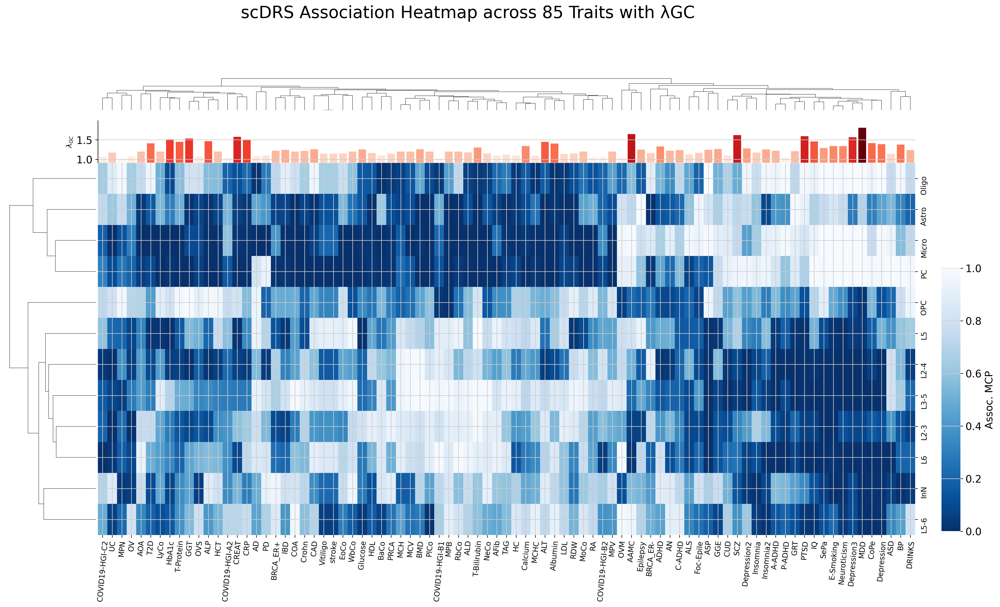

In [10]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ================================
# 1. 自动读取 traits
# ================================
data_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"

traits = [
    f.replace(".scdrs_group.cell_type", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.cell_type")
]

traits = sorted(traits)  # 保证顺序稳定
print(f"共读取 {len(traits)} 个 traits")
# ================================
# 读取 λGC 并筛选 traits
# ================================
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

# 过滤 λGC <= 3
valid_traits = df_gc[df_gc["Lambda_GC"] <= 2].index.tolist()

# 与已有 traits 取交集
traits_filtered = [t for t in traits if t in valid_traits]

print(f"原始 traits 数量: {len(traits)}")
print(f"λGC<=2 后剩余: {len(traits_filtered)}")

# ================================
# 2. 读取 scDRS 结果
# ================================
dict_df_stats = {
    trait: pd.read_csv(
        os.path.join(data_dir, f"{trait}.scdrs_group.cell_type"),
        sep="\t", index_col=0
    )
    for trait in traits_filtered
}

# 使用第一个 trait 的 celltype 作为索引
samples = list(dict_df_stats[traits_filtered[0]].index)

assoc_matrix = np.array([
    dict_df_stats[trait].loc[samples, "assoc_mcp"].values
    for trait in traits_filtered
]).T

df_assoc = pd.DataFrame(assoc_matrix, index=samples, columns=traits_filtered)

# ================================
# 3. 读取 λGC
# ================================
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

lambda_gc_values = []
for t in traits_filtered:
    if t in df_gc.index:
        lambda_gc_values.append(df_gc.loc[t, "Lambda_GC"])
    else:
        lambda_gc_values.append(np.nan)

lambda_gc_values = np.array(lambda_gc_values, dtype=float)

# 处理异常值
lambda_gc_values = np.nan_to_num(lambda_gc_values, nan=1.0, posinf=1.0, neginf=1.0)

# ================================
# 4. 画 clustermap
# ================================
g = sns.clustermap(
    df_assoc,
    cmap="Blues_r",
    vmin=0, vmax=1,
    figsize=(18, 10), 
    row_cluster=True,
    col_cluster=True,
    xticklabels=True,
    yticklabels=True,
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=(1.0, 0.2, 0.02, 0.5),
    cbar_kws={"label": "Assoc. MCP"}
)

# ================================
# 5. 获取聚类顺序
# ================================
col_order = g.dendrogram_col.reordered_ind
ordered_traits = [df_assoc.columns[i] for i in col_order]
ordered_gc = [lambda_gc_values[traits_filtered.index(t)] for t in ordered_traits]

# ================================
# 6. 调整 dendrogram
# ================================
col_dendro_ax = g.ax_col_dendrogram
pos = col_dendro_ax.get_position()

col_dendro_ax.set_position([
    pos.x0,
    pos.y0 + 0.1,
    pos.width,
    pos.height * 0.8
])

# ================================
# 7. λGC barplot
# ================================
bar_ax = g.fig.add_axes([
    pos.x0,
    pos.y0, 
    pos.width,
    0.08
])

# 确保 x 轴范围与热图完全一致
bar_ax.set_xlim(g.ax_heatmap.get_xlim())

# 绘图：x 坐标应为 np.arange(len) + 0.5 来居中对齐
x_pos = np.arange(len(ordered_traits)) + 0.5
norm = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
colors = [cm.Reds(norm(val)) for val in ordered_gc]

bar_ax.bar(x_pos, ordered_gc, color=colors, width=0.8, align='center')

# 移除刻度，仅保留 y 轴标签
bar_ax.set_xticks([])
bar_ax.set_ylabel("$\lambda_{GC}$", fontsize=10)

# 动态调整 Y 轴范围
y_min = min(ordered_gc) * 0.9
bar_ax.set_ylim(y_min, max(ordered_gc) * 1.1)

bar_ax.spines[["top", "right", "bottom"]].set_visible(False)
# ================================
# 8. 标签优化
# ================================
heatmap_ax = g.ax_heatmap

heatmap_ax.set_xticklabels(
    ordered_traits,
    rotation=85,  
    fontsize=10
)

heatmap_ax.set_yticklabels(
    heatmap_ax.get_yticklabels(),
    fontsize=10
)

# ================================
# 9. 标题 & 保存
# ================================
g.fig.suptitle(
    "scDRS Association Heatmap across 85 Traits with λGC",
    fontsize=23,
    y=1.2
)

plt.savefig(
    "female_results/traits_90_scDRS_lambdaGC_heatmap_MCP_λGC<2_ct_female.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.savefig(
    "female_results/traits_90_scDRS_lambdaGC_heatmap_MCP_λGC<2_ct_female.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


共读取 90 个 traits
原始 traits 数量: 90
λGC<=2 后剩余: 85


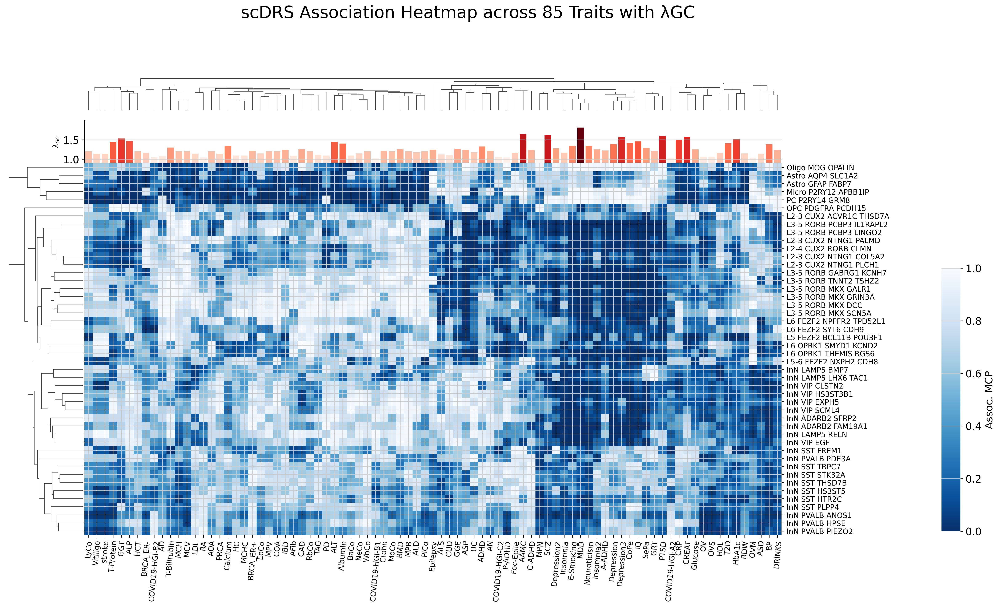

In [11]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ================================
# 1. 自动读取 traits
# ================================
data_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"

traits = [
    f.replace(".scdrs_group.cell_subtype", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.cell_subtype")
]

traits = sorted(traits)  # 保证顺序稳定
print(f"共读取 {len(traits)} 个 traits")
# ================================
# 读取 λGC 并筛选 traits
# ================================
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

# 过滤 λGC <= 3
valid_traits = df_gc[df_gc["Lambda_GC"] <= 2 ].index.tolist()

# 与已有 traits 取交集
traits_filtered = [t for t in traits if t in valid_traits]

print(f"原始 traits 数量: {len(traits)}")
print(f"λGC<=2 后剩余: {len(traits_filtered)}")

# ================================
# 2. 读取 scDRS 结果
# ================================
dict_df_stats = {
    trait: pd.read_csv(
        os.path.join(data_dir, f"{trait}.scdrs_group.cell_subtype"),
        sep="\t", index_col=0
    )
    for trait in traits_filtered
}

# 使用第一个 trait 的 celltype 作为索引
samples = list(dict_df_stats[traits_filtered[0]].index)

assoc_matrix = np.array([
    dict_df_stats[trait].loc[samples, "assoc_mcp"].values
    for trait in traits_filtered
]).T

df_assoc = pd.DataFrame(assoc_matrix, index=samples, columns=traits_filtered)

# ================================
# 3. 读取 λGC
# ================================
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

lambda_gc_values = []
for t in traits_filtered:
    if t in df_gc.index:
        lambda_gc_values.append(df_gc.loc[t, "Lambda_GC"])
    else:
        lambda_gc_values.append(np.nan)

lambda_gc_values = np.array(lambda_gc_values, dtype=float)

# 处理异常值
lambda_gc_values = np.nan_to_num(lambda_gc_values, nan=1.0, posinf=1.0, neginf=1.0)

# ================================
# 4. 画 clustermap
# ================================
g = sns.clustermap(
    df_assoc,
    cmap="Blues_r",
    vmin=0, vmax=1,
    figsize=(18, 10), 
    row_cluster=True,
    col_cluster=True,
    xticklabels=True,
    yticklabels=True,
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=(1.0, 0.2, 0.02, 0.5),
    cbar_kws={"label": "Assoc. MCP"}
)

# ================================
# 5. 获取聚类顺序
# ================================
col_order = g.dendrogram_col.reordered_ind
ordered_traits = [df_assoc.columns[i] for i in col_order]
ordered_gc = [lambda_gc_values[traits_filtered.index(t)] for t in ordered_traits]

# ================================
# 6. 调整 dendrogram
# ================================
col_dendro_ax = g.ax_col_dendrogram
pos = col_dendro_ax.get_position()

col_dendro_ax.set_position([
    pos.x0,
    pos.y0 + 0.1,
    pos.width,
    pos.height * 0.8
])

# ================================
# 7. λGC barplot
# ================================
bar_ax = g.fig.add_axes([
    pos.x0,
    pos.y0, 
    pos.width,
    0.08
])

# 确保 x 轴范围与热图完全一致
bar_ax.set_xlim(g.ax_heatmap.get_xlim())

# 绘图：x 坐标应为 np.arange(len) + 0.5 来居中对齐
x_pos = np.arange(len(ordered_traits)) + 0.5
norm = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
colors = [cm.Reds(norm(val)) for val in ordered_gc]

bar_ax.bar(x_pos, ordered_gc, color=colors, width=0.8, align='center')

# 移除刻度，仅保留 y 轴标签
bar_ax.set_xticks([])
bar_ax.set_ylabel("$\lambda_{GC}$", fontsize=10)

# 动态调整 Y 轴范围
y_min = min(ordered_gc) * 0.9
bar_ax.set_ylim(y_min, max(ordered_gc) * 1.1)

bar_ax.spines[["top", "right", "bottom"]].set_visible(False)
# ================================
# 8. 标签优化
# ================================
heatmap_ax = g.ax_heatmap

heatmap_ax.set_xticklabels(
    ordered_traits,
    rotation=85,  
    fontsize=10
)

heatmap_ax.set_yticklabels(
    heatmap_ax.get_yticklabels(),
    fontsize=10
)

# ================================
# 9. 标题 & 保存
# ================================
g.fig.suptitle(
    "scDRS Association Heatmap across 85 Traits with λGC",
    fontsize=23,
    y=1.2
)

plt.savefig(
    "female_results/traits_90_scDRS_lambdaGC_heatmap_MCP_λGC<2_cts_female.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.savefig(
    "female_results/traits_90_scDRS_lambdaGC_heatmap_MCP_λGC<2_cts_female.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


共读取 90 个 traits
原始 traits 数量: 90
λGC<=2 后剩余: 85


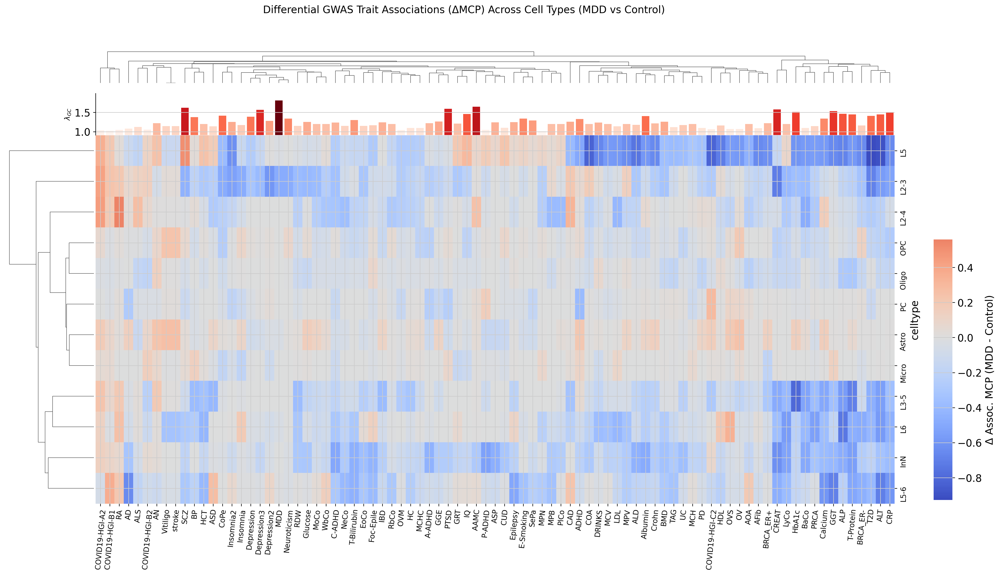

In [13]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ================================
# 1. 路径设置
# ================================
data_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 自动读取 traits
# ================================
traits = [
    f.replace(".scdrs_group.ct_con", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.ct_con")
]

traits = sorted(traits)
print(f"共读取 {len(traits)} 个 traits")

# ================================
# 3. 读取 λGC 并筛选 traits
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

valid_traits = df_gc[df_gc["Lambda_GC"] <= 2].index.tolist()
traits_filtered = [t for t in traits if t in valid_traits]

print(f"原始 traits 数量: {len(traits)}")
print(f"λGC<=2 后剩余: {len(traits_filtered)}")

# ================================
# 4. 计算 ΔMCP
# ================================
dict_delta = {}

for trait in traits_filtered:
    file_path = os.path.join(data_dir, f"{trait}.scdrs_group.ct_con")
    
    if not os.path.exists(file_path):
        continue
    
    df = pd.read_csv(file_path, sep="\t")
    
    # 拆分 group → condition + celltype
    df[["celltype", "condition"]] = df["group"].str.split("&", expand=True)
    
    # pivot
    df_wide = df.pivot(index="celltype", columns="condition", values="assoc_mcp")
    
    # 检查是否有 C 和 S
    if not {"C", "S"}.issubset(df_wide.columns):
        continue
    
    # 计算 ΔMCP
    df_wide["delta"] = df_wide["S"] - df_wide["C"]
    
    dict_delta[trait] = df_wide["delta"]

# 合并为矩阵
df_delta = pd.DataFrame(dict_delta)

# 行排序（保证一致）
df_delta = df_delta.sort_index()

# ================================
# 5. 处理 λGC 顺序
# ================================
lambda_gc_values = []
for t in df_delta.columns:
    if t in df_gc.index:
        lambda_gc_values.append(df_gc.loc[t, "Lambda_GC"])
    else:
        lambda_gc_values.append(np.nan)

lambda_gc_values = np.array(lambda_gc_values, dtype=float)
lambda_gc_values = np.nan_to_num(lambda_gc_values, nan=1.0, posinf=1.0, neginf=1.0)

# ================================
# 6. 画 clustermap（ΔMCP）
# ================================
g = sns.clustermap(
    df_delta,
    cmap="coolwarm",
    center=0, 
    figsize=(18, 10),
    row_cluster=True,
    col_cluster=True,
    xticklabels=True,
    yticklabels=True,
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=(1.0, 0.2, 0.02, 0.5),
    cbar_kws={"label": "Δ Assoc. MCP (MDD - Control)"}
)

# ================================
# 7. 获取聚类顺序
# ================================
col_order = g.dendrogram_col.reordered_ind
ordered_traits = [df_delta.columns[i] for i in col_order]
ordered_gc = [df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0 for t in ordered_traits]

# ================================
# 8. 调整 dendrogram 位置
# ================================
col_dendro_ax = g.ax_col_dendrogram
pos = col_dendro_ax.get_position()

col_dendro_ax.set_position([
    pos.x0,
    pos.y0 + 0.1,
    pos.width,
    pos.height * 0.8
])

# ================================
# 9. λGC barplot
# ================================
bar_ax = g.fig.add_axes([
    pos.x0,
    pos.y0,
    pos.width,
    0.08
])

bar_ax.set_xlim(g.ax_heatmap.get_xlim())

x_pos = np.arange(len(ordered_traits)) + 0.5

norm = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
colors = [cm.Reds(norm(val)) for val in ordered_gc]

bar_ax.bar(x_pos, ordered_gc, color=colors, width=0.8, align='center')

bar_ax.set_xticks([])
bar_ax.set_ylabel("$\\lambda_{GC}$", fontsize=10)

y_min = min(ordered_gc) * 0.9
bar_ax.set_ylim(y_min, max(ordered_gc) * 1.1)

bar_ax.spines[["top", "right", "bottom"]].set_visible(False)

# ================================
# 10. 标签优化
# ================================
heatmap_ax = g.ax_heatmap

heatmap_ax.set_xticklabels(
    ordered_traits,
    rotation=85,
    fontsize=10
)

heatmap_ax.set_yticklabels(
    heatmap_ax.get_yticklabels(),
    fontsize=10
)

# ================================
# 11. 标题 & 保存
# ================================
g.fig.suptitle(
    "Differential GWAS Trait Associations (ΔMCP) Across Cell Types (MDD vs Control)",
    fontsize=14,
    y=1.15
)

plt.savefig(
    "female_results/scDRS_deltaMCP_conCT_lambdaGC_heatmap.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.savefig(
    "female_results/scDRS_deltaMCP_conCT_lambdaGC_heatmap.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

共读取 90 个 traits
原始 traits 数量: 90
λGC<=2 后剩余: 85


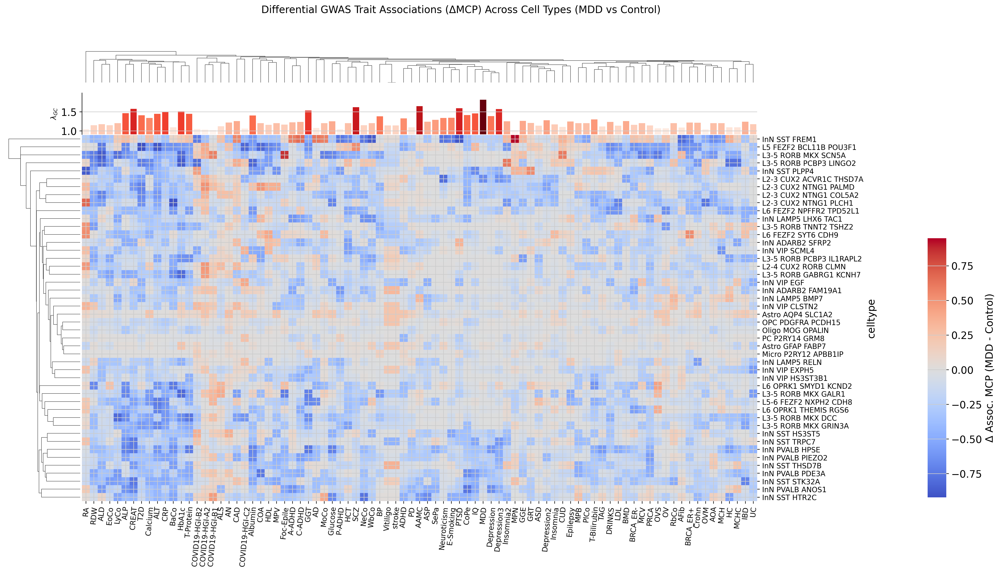

In [14]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ================================
# 1. 路径设置
# ================================
data_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 自动读取 traits
# ================================
traits = [
    f.replace(".scdrs_group.cts_con", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.cts_con")
]

traits = sorted(traits)
print(f"共读取 {len(traits)} 个 traits")

# ================================
# 3. 读取 λGC 并筛选 traits
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

valid_traits = df_gc[df_gc["Lambda_GC"] <= 2].index.tolist()
traits_filtered = [t for t in traits if t in valid_traits]

print(f"原始 traits 数量: {len(traits)}")
print(f"λGC<=2 后剩余: {len(traits_filtered)}")

# ================================
# 4. 计算 ΔMCP
# ================================
dict_delta = {}

for trait in traits_filtered:
    file_path = os.path.join(data_dir, f"{trait}.scdrs_group.cts_con")
    
    if not os.path.exists(file_path):
        continue
    
    df = pd.read_csv(file_path, sep="\t")
    
    # 拆分 group → condition + celltype
    df[["celltype", "condition"]] = df["group"].str.split("&", expand=True)
    
    # pivot
    df_wide = df.pivot(index="celltype", columns="condition", values="assoc_mcp")
    
    # 检查是否有 C 和 S
    if not {"C", "S"}.issubset(df_wide.columns):
        continue
    
    # 计算 ΔMCP
    df_wide["delta"] = df_wide["S"] - df_wide["C"]
    
    dict_delta[trait] = df_wide["delta"]

# 合并为矩阵
df_delta = pd.DataFrame(dict_delta)

# 行排序（保证一致）
df_delta = df_delta.sort_index()

# ================================
# 5. 处理 λGC 顺序
# ================================
lambda_gc_values = []
for t in df_delta.columns:
    if t in df_gc.index:
        lambda_gc_values.append(df_gc.loc[t, "Lambda_GC"])
    else:
        lambda_gc_values.append(np.nan)

lambda_gc_values = np.array(lambda_gc_values, dtype=float)
lambda_gc_values = np.nan_to_num(lambda_gc_values, nan=1.0, posinf=1.0, neginf=1.0)

# ================================
# 6. 画 clustermap（ΔMCP）
# ================================
g = sns.clustermap(
    df_delta,
    cmap="coolwarm",
    center=0, 
    figsize=(18, 10),
    row_cluster=True,
    col_cluster=True,
    xticklabels=True,
    yticklabels=True,
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=(1.0, 0.2, 0.02, 0.5),
    cbar_kws={"label": "Δ Assoc. MCP (MDD - Control)"}
)

# ================================
# 7. 获取聚类顺序
# ================================
col_order = g.dendrogram_col.reordered_ind
ordered_traits = [df_delta.columns[i] for i in col_order]
ordered_gc = [df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0 for t in ordered_traits]

# ================================
# 8. 调整 dendrogram 位置
# ================================
col_dendro_ax = g.ax_col_dendrogram
pos = col_dendro_ax.get_position()

col_dendro_ax.set_position([
    pos.x0,
    pos.y0 + 0.1,
    pos.width,
    pos.height * 0.8
])

# ================================
# 9. λGC barplot
# ================================
bar_ax = g.fig.add_axes([
    pos.x0,
    pos.y0,
    pos.width,
    0.08
])

bar_ax.set_xlim(g.ax_heatmap.get_xlim())

x_pos = np.arange(len(ordered_traits)) + 0.5

norm = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
colors = [cm.Reds(norm(val)) for val in ordered_gc]

bar_ax.bar(x_pos, ordered_gc, color=colors, width=0.8, align='center')

bar_ax.set_xticks([])
bar_ax.set_ylabel("$\\lambda_{GC}$", fontsize=10)

y_min = min(ordered_gc) * 0.9
bar_ax.set_ylim(y_min, max(ordered_gc) * 1.1)

bar_ax.spines[["top", "right", "bottom"]].set_visible(False)

# ================================
# 10. 标签优化
# ================================
heatmap_ax = g.ax_heatmap

heatmap_ax.set_xticklabels(
    ordered_traits,
    rotation=85,
    fontsize=10
)

heatmap_ax.set_yticklabels(
    heatmap_ax.get_yticklabels(),
    fontsize=10
)

# ================================
# 11. 标题 & 保存
# ================================
g.fig.suptitle(
    "Differential GWAS Trait Associations (ΔMCP) Across Cell Types (MDD vs Control)",
    fontsize=14,
    y=1.15
)

plt.savefig(
    "female_results/scDRS_deltaMCP_conCTS_lambdaGC_heatmap.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.savefig(
    "female_results/scDRS_deltaMCP_conCTS_lambdaGC_heatmap.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

共读取 90 个 traits
原始 traits 数量: 90
λGC<=2 后剩余: 85


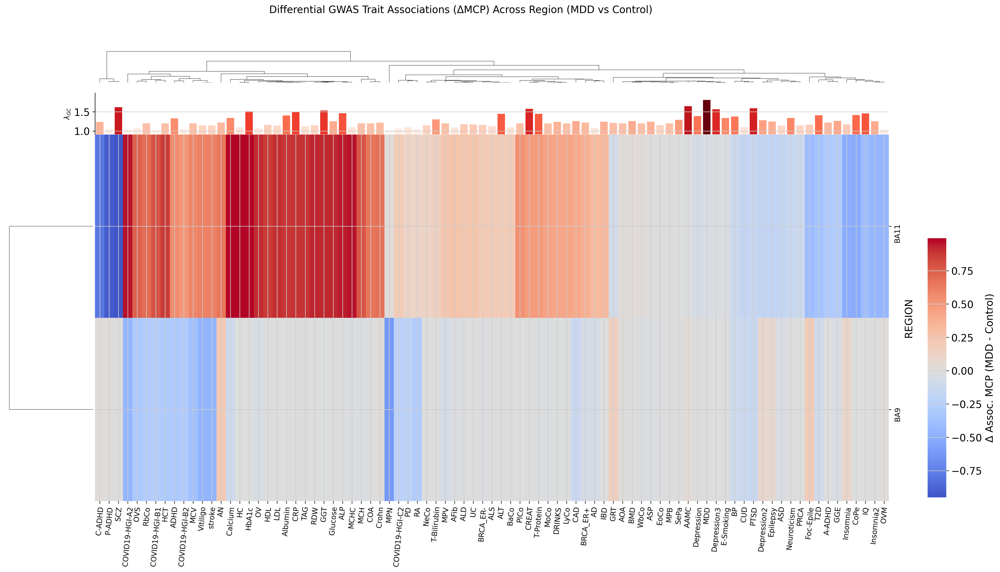

In [16]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ================================
# 1. 路径设置
# ================================
data_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 自动读取 traits
# ================================
traits = [
    f.replace(".scdrs_group.region_con", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.region_con")
]

traits = sorted(traits)
print(f"共读取 {len(traits)} 个 traits")

# ================================
# 3. 读取 λGC 并筛选 traits
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

valid_traits = df_gc[df_gc["Lambda_GC"] <= 2].index.tolist()
traits_filtered = [t for t in traits if t in valid_traits]

print(f"原始 traits 数量: {len(traits)}")
print(f"λGC<=2 后剩余: {len(traits_filtered)}")

# ================================
# 4. 计算 ΔMCP
# ================================
dict_delta = {}

for trait in traits_filtered:
    file_path = os.path.join(data_dir, f"{trait}.scdrs_group.region_con")
    
    if not os.path.exists(file_path):
        continue
    
    df = pd.read_csv(file_path, sep="\t")
    
    # 拆分 group → condition + celltype
    df[["REGION", "condition"]] = df["group"].str.split("&", expand=True)
    
    # pivot
    df_wide = df.pivot(index="REGION", columns="condition", values="assoc_mcp")
    
    # 检查是否有 C 和 S
    if not {"C", "S"}.issubset(df_wide.columns):
        continue
    
    # 计算 ΔMCP
    df_wide["delta"] = df_wide["S"] - df_wide["C"]
    
    dict_delta[trait] = df_wide["delta"]

# 合并为矩阵
df_delta = pd.DataFrame(dict_delta)

# 行排序（保证一致）
df_delta = df_delta.sort_index()

# ================================
# 5. 处理 λGC 顺序
# ================================
lambda_gc_values = []
for t in df_delta.columns:
    if t in df_gc.index:
        lambda_gc_values.append(df_gc.loc[t, "Lambda_GC"])
    else:
        lambda_gc_values.append(np.nan)

lambda_gc_values = np.array(lambda_gc_values, dtype=float)
lambda_gc_values = np.nan_to_num(lambda_gc_values, nan=1.0, posinf=1.0, neginf=1.0)

# ================================
# 6. 画 clustermap（ΔMCP）
# ================================
g = sns.clustermap(
    df_delta,
    cmap="coolwarm",
    center=0, 
    figsize=(18, 10),
    row_cluster=True,
    col_cluster=True,
    xticklabels=True,
    yticklabels=True,
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=(1.0, 0.2, 0.02, 0.5),
    cbar_kws={"label": "Δ Assoc. MCP (MDD - Control)"}
)

# ================================
# 7. 获取聚类顺序
# ================================
col_order = g.dendrogram_col.reordered_ind
ordered_traits = [df_delta.columns[i] for i in col_order]
ordered_gc = [df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0 for t in ordered_traits]

# ================================
# 8. 调整 dendrogram 位置
# ================================
col_dendro_ax = g.ax_col_dendrogram
pos = col_dendro_ax.get_position()

col_dendro_ax.set_position([
    pos.x0,
    pos.y0 + 0.1,
    pos.width,
    pos.height * 0.8
])

# ================================
# 9. λGC barplot
# ================================
bar_ax = g.fig.add_axes([
    pos.x0,
    pos.y0,
    pos.width,
    0.08
])

bar_ax.set_xlim(g.ax_heatmap.get_xlim())

x_pos = np.arange(len(ordered_traits)) + 0.5

norm = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
colors = [cm.Reds(norm(val)) for val in ordered_gc]

bar_ax.bar(x_pos, ordered_gc, color=colors, width=0.8, align='center')

bar_ax.set_xticks([])
bar_ax.set_ylabel("$\\lambda_{GC}$", fontsize=10)

y_min = min(ordered_gc) * 0.9
bar_ax.set_ylim(y_min, max(ordered_gc) * 1.1)

bar_ax.spines[["top", "right", "bottom"]].set_visible(False)

# ================================
# 10. 标签优化
# ================================
heatmap_ax = g.ax_heatmap

heatmap_ax.set_xticklabels(
    ordered_traits,
    rotation=85,
    fontsize=10
)

heatmap_ax.set_yticklabels(
    heatmap_ax.get_yticklabels(),
    fontsize=10
)

# ================================
# 11. 标题 & 保存
# ================================
g.fig.suptitle(
    "Differential GWAS Trait Associations (ΔMCP) Across Region (MDD vs Control)",
    fontsize=14,
    y=1.15
)

plt.savefig(
    "female_results/scDRS_deltaMCP_conREGION_lambdaGC_heatmap.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.savefig(
    "female_results/scDRS_deltaMCP_conREGION_lambdaGC_heatmap.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

共读取 90 个 traits
原始 traits 数量: 90
λGC<=2 后剩余: 85


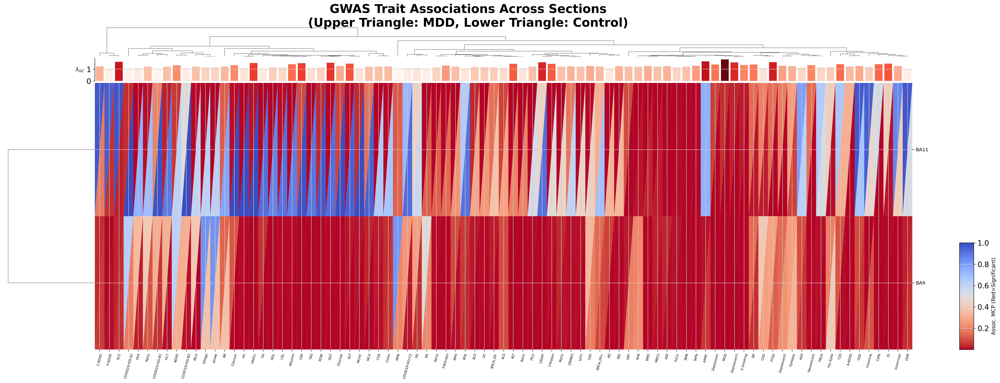

In [18]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from matplotlib.cm import ScalarMappable

# ================================
# 1. 路径设置
# ================================
data_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 自动读取 traits
# ================================
traits = [
    f.replace(".scdrs_group.region_con", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.region_con")
]
traits = sorted(traits)

print(f"共读取 {len(traits)} 个 traits")

# ================================
# 3. 读取 λGC 并筛选
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

valid_traits = df_gc[df_gc["Lambda_GC"] <= 2].index.tolist()
traits_filtered = [t for t in traits if t in valid_traits]

print(f"原始 traits 数量: {len(traits)}")
print(f"λGC<=2 后剩余: {len(traits_filtered)}")

# ================================
# 4. 构建 S / C 矩阵
# ================================
dict_S = {}
dict_C = {}

for trait in traits_filtered:
    file_path = os.path.join(data_dir, f"{trait}.scdrs_group.region_con")
    
    if not os.path.exists(file_path):
        continue
    
    df = pd.read_csv(file_path, sep="\t")
    
    df[["section", "condition"]] = df["group"].str.split("&", expand=True)
    
    df_wide = df.pivot(index="section", columns="condition", values="assoc_mcp")
    
    if not {"C", "S"}.issubset(df_wide.columns):
        continue
    
    dict_S[trait] = df_wide["S"]
    dict_C[trait] = df_wide["C"]

df_S = pd.DataFrame(dict_S).sort_index()
df_C = pd.DataFrame(dict_C).sort_index()

# ================================
# 5. ΔMCP 用于聚类
# ================================
df_delta = df_S - df_C

# ================================
# 6. clustermap（只用于拿聚类顺序）
# ================================
g = sns.clustermap(
    df_delta,
    cmap="coolwarm_r",
    center=0,
    figsize=(25, 10),
    row_cluster=True,
    col_cluster=True,
    xticklabels=True,
    yticklabels=True,
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=None
)

# ================================
# 7. 获取排序
# ================================
row_order = g.dendrogram_row.reordered_ind
col_order = g.dendrogram_col.reordered_ind

df_S = df_S.iloc[row_order, col_order]
df_C = df_C.iloc[row_order, col_order]

ordered_traits = df_S.columns

# ================================
# 8. λGC 顺序
# ================================
ordered_gc = [
    df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0
    for t in ordered_traits
]

# ================================
# 9. 清空 heatmap
# ================================
g.ax_heatmap.clear()
ax = g.ax_heatmap

# ================================
# 10. 颜色范围与反转 (MCP 越小越红)
# ================================
vmin = min(df_S.min().min(), df_C.min().min())
vmax = max(df_S.max().max(), df_C.max().max())

norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
# 使用 _r 反转色标：小值红，大值蓝
cmap = cm.get_cmap("coolwarm_r")

# ================================
# 11. 画三角形 heatmap
# ================================
n_rows, n_cols = df_S.shape

for i in range(n_rows):
    for j in range(n_cols):
        val_S = df_S.iloc[i, j]
        val_C = df_C.iloc[i, j]

        x = j
        y = i

        # 左下：Control
        tri_C = patches.Polygon(
            [(x, y), (x+1, y), (x, y+1)],
            facecolor=cmap(norm(val_C)),
            edgecolor='none'
        )

        # 右上：MDD
        tri_S = patches.Polygon(
            [(x+1, y+1), (x+1, y), (x, y+1)],
            facecolor=cmap(norm(val_S)),
            edgecolor='none'
        )

        ax.add_patch(tri_C)
        ax.add_patch(tri_S)

# ================================
# 12. 轴设置
# ================================
ax.set_xlim(0, n_cols)
ax.set_ylim(0, n_rows)
ax.invert_yaxis()

ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(ordered_traits, rotation=75, fontsize=6)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(df_S.index, fontsize=9)

# ================================
# 13. λGC barplot (紧凑对齐逻辑)
# ================================
hm_pos = g.ax_heatmap.get_position()

# 1. 设置 barplot：紧贴 heatmap 顶部，间距 0.005
bar_height = 0.06
bar_y0 = hm_pos.y1 + 0.005 
bar_ax = g.fig.add_axes([
    hm_pos.x0, 
    bar_y0, 
    hm_pos.width, 
    bar_height
])

# 2. 设置聚类树：紧贴 barplot 顶部，间距 0.005
dendro_height = 0.08
dendro_y0 = bar_y0 + bar_height + 0.005
g.ax_col_dendrogram.set_position([
    hm_pos.x0, 
    dendro_y0, 
    hm_pos.width, 
    dendro_height
])

# 绘图逻辑
x_pos = np.arange(len(ordered_traits)) + 0.5
norm_gc = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
colors_gc = [cm.Reds(norm_gc(val)) for val in ordered_gc]

bar_ax.bar(x_pos, ordered_gc, color=colors_gc, width=0.8)
bar_ax.set_xlim(0, n_cols)
bar_ax.set_xticks([])
bar_ax.set_ylabel("$\\lambda_{GC}$", fontsize=10, rotation=0, ha='right', va='center')
bar_ax.spines[["top", "right", "bottom"]].set_visible(False)

# ================================
# 14. colorbar (侧边定位)
# ================================
# 将 0.1 改为 0.05 左右，如果还是重叠 y 轴 label 再调大
cbar_ax = g.fig.add_axes([
    hm_pos.x1 + 0.05, 
    hm_pos.y0, 
    0.015, 
    hm_pos.height * 0.4
])

sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = g.fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Assoc. MCP (Red=Significant)", fontsize=10)

# ================================
# 15. 标题 & 保存 (动态定位)
# ================================
# 标题位置设置在聚类树顶端再往上一点
# 计算聚类树的顶端位置
top_of_plot = dendro_y0 + dendro_height

g.fig.suptitle(
    "GWAS Trait Associations Across Sections\n(Upper Triangle: MDD, Lower Triangle: Control)",
    fontsize=23,
    fontweight='bold',
    y = top_of_plot + 0.06  # 动态计算，确保不重叠
)

# 保存时去掉 subplots_adjust，完全依赖定位和 tight 布局
plt.savefig(
    "female_results/scDRS_triangle_MCP_heatmap_lambdaGC_section.pdf",
    dpi=300,
    bbox_inches="tight" 
)
plt.savefig(
    "female_results/scDRS_triangle_MCP_heatmap_lambdaGC_section.png",
    dpi=300,
    bbox_inches="tight" 
)

plt.show()

共读取 90 个 traits
原始 traits 数量: 90
λGC<=2 后剩余: 85


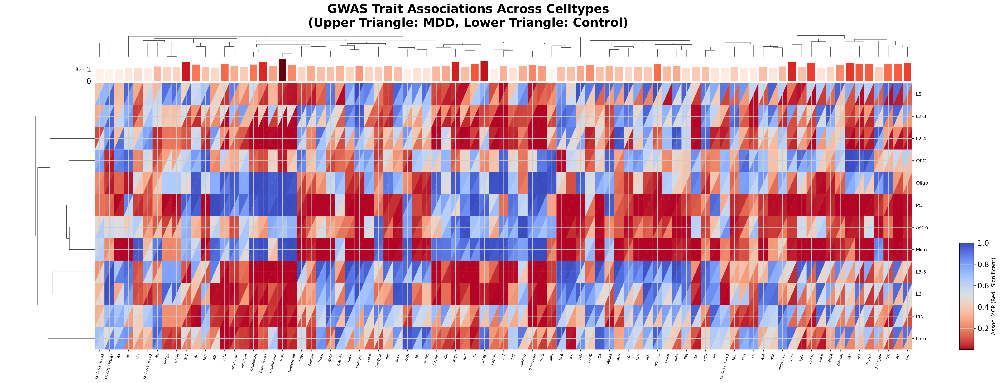

In [19]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from matplotlib.cm import ScalarMappable

# ================================
# 1. 路径设置
# ================================
data_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 自动读取 traits
# ================================
traits = [
    f.replace(".scdrs_group.ct_con", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.ct_con")
]
traits = sorted(traits)

print(f"共读取 {len(traits)} 个 traits")

# ================================
# 3. 读取 λGC 并筛选
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

valid_traits = df_gc[df_gc["Lambda_GC"] <= 2].index.tolist()
traits_filtered = [t for t in traits if t in valid_traits]

print(f"原始 traits 数量: {len(traits)}")
print(f"λGC<=2 后剩余: {len(traits_filtered)}")

# ================================
# 4. 构建 S / C 矩阵
# ================================
dict_S = {}
dict_C = {}

for trait in traits_filtered:
    file_path = os.path.join(data_dir, f"{trait}.scdrs_group.ct_con")
    
    if not os.path.exists(file_path):
        continue
    
    df = pd.read_csv(file_path, sep="\t")
    
    df[["celltype", "condition"]] = df["group"].str.split("&", expand=True)
    
    df_wide = df.pivot(index="celltype", columns="condition", values="assoc_mcp")
    
    if not {"C", "S"}.issubset(df_wide.columns):
        continue
    
    dict_S[trait] = df_wide["S"]
    dict_C[trait] = df_wide["C"]

df_S = pd.DataFrame(dict_S).sort_index()
df_C = pd.DataFrame(dict_C).sort_index()

# ================================
# 5. ΔMCP 用于聚类
# ================================
df_delta = df_S - df_C

# ================================
# 6. clustermap（只用于拿聚类顺序）
# ================================
g = sns.clustermap(
    df_delta,
    cmap="coolwarm_r",
    center=0,
    figsize=(25, 10),
    row_cluster=True,
    col_cluster=True,
    xticklabels=True,
    yticklabels=True,
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=None
)

# ================================
# 7. 获取排序
# ================================
row_order = g.dendrogram_row.reordered_ind
col_order = g.dendrogram_col.reordered_ind

df_S = df_S.iloc[row_order, col_order]
df_C = df_C.iloc[row_order, col_order]

ordered_traits = df_S.columns

# ================================
# 8. λGC 顺序
# ================================
ordered_gc = [
    df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0
    for t in ordered_traits
]

# ================================
# 9. 清空 heatmap
# ================================
g.ax_heatmap.clear()
ax = g.ax_heatmap

# ================================
# 10. 颜色范围与反转 (MCP 越小越红)
# ================================
vmin = min(df_S.min().min(), df_C.min().min())
vmax = max(df_S.max().max(), df_C.max().max())

norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
# 使用 _r 反转色标：小值红，大值蓝
cmap = cm.get_cmap("coolwarm_r")

# ================================
# 11. 画三角形 heatmap
# ================================
n_rows, n_cols = df_S.shape

for i in range(n_rows):
    for j in range(n_cols):
        val_S = df_S.iloc[i, j]
        val_C = df_C.iloc[i, j]

        x = j
        y = i

        # 左下：Control
        tri_C = patches.Polygon(
            [(x, y), (x+1, y), (x, y+1)],
            facecolor=cmap(norm(val_C)),
            edgecolor='none'
        )

        # 右上：MDD
        tri_S = patches.Polygon(
            [(x+1, y+1), (x+1, y), (x, y+1)],
            facecolor=cmap(norm(val_S)),
            edgecolor='none'
        )

        ax.add_patch(tri_C)
        ax.add_patch(tri_S)

# ================================
# 12. 轴设置
# ================================
ax.set_xlim(0, n_cols)
ax.set_ylim(0, n_rows)
ax.invert_yaxis()

ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(ordered_traits, rotation=75, fontsize=6)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(df_S.index, fontsize=9)

# ================================
# 13. λGC barplot (紧凑对齐逻辑)
# ================================
hm_pos = g.ax_heatmap.get_position()

# 1. 设置 barplot：紧贴 heatmap 顶部，间距 0.005
bar_height = 0.06
bar_y0 = hm_pos.y1 + 0.005 
bar_ax = g.fig.add_axes([
    hm_pos.x0, 
    bar_y0, 
    hm_pos.width, 
    bar_height
])

# 2. 设置聚类树：紧贴 barplot 顶部，间距 0.005
dendro_height = 0.08
dendro_y0 = bar_y0 + bar_height + 0.005
g.ax_col_dendrogram.set_position([
    hm_pos.x0, 
    dendro_y0, 
    hm_pos.width, 
    dendro_height
])

# 绘图逻辑
x_pos = np.arange(len(ordered_traits)) + 0.5
norm_gc = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
colors_gc = [cm.Reds(norm_gc(val)) for val in ordered_gc]

bar_ax.bar(x_pos, ordered_gc, color=colors_gc, width=0.8)
bar_ax.set_xlim(0, n_cols)
bar_ax.set_xticks([])
bar_ax.set_ylabel("$\\lambda_{GC}$", fontsize=10, rotation=0, ha='right', va='center')
bar_ax.spines[["top", "right", "bottom"]].set_visible(False)

# ================================
# 14. colorbar (侧边定位)
# ================================
# 将 0.1 改为 0.05 左右，如果还是重叠 y 轴 label 再调大
cbar_ax = g.fig.add_axes([
    hm_pos.x1 + 0.05, 
    hm_pos.y0, 
    0.015, 
    hm_pos.height * 0.4
])

sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = g.fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Assoc. MCP (Red=Significant)", fontsize=10)

# ================================
# 15. 标题 & 保存 (动态定位)
# ================================
# 标题位置设置在聚类树顶端再往上一点
# 计算聚类树的顶端位置
top_of_plot = dendro_y0 + dendro_height

g.fig.suptitle(
    "GWAS Trait Associations Across Celltypes\n(Upper Triangle: MDD, Lower Triangle: Control)",
    fontsize=23,
    fontweight='bold',
    y = top_of_plot + 0.06  # 动态计算，确保不重叠
)

# 保存时去掉 subplots_adjust，完全依赖定位和 tight 布局
plt.savefig(
    "female_results/scDRS_triangle_MCP_heatmap_lambdaGC_ct.pdf",
    dpi=300,
    bbox_inches="tight" 
)
plt.savefig(
    "female_results/scDRS_triangle_MCP_heatmap_lambdaGC_ct.png",
    dpi=300,
    bbox_inches="tight" 
)

plt.show()

共读取 90 个 traits
原始 traits 数量: 90
λGC<=2 后剩余: 85


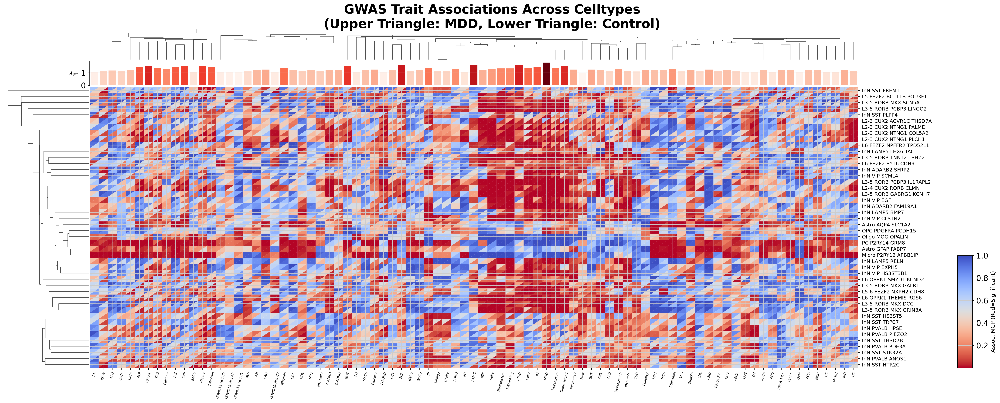

In [22]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from matplotlib.cm import ScalarMappable

# ================================
# 1. 路径设置
# ================================
data_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 自动读取 traits
# ================================
traits = [
    f.replace(".scdrs_group.cts_con", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.cts_con")
]
traits = sorted(traits)

print(f"共读取 {len(traits)} 个 traits")

# ================================
# 3. 读取 λGC 并筛选
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

valid_traits = df_gc[df_gc["Lambda_GC"] <= 2].index.tolist()
traits_filtered = [t for t in traits if t in valid_traits]

print(f"原始 traits 数量: {len(traits)}")
print(f"λGC<=2 后剩余: {len(traits_filtered)}")

# ================================
# 4. 构建 S / C 矩阵
# ================================
dict_S = {}
dict_C = {}

for trait in traits_filtered:
    file_path = os.path.join(data_dir, f"{trait}.scdrs_group.cts_con")
    
    if not os.path.exists(file_path):
        continue
    
    df = pd.read_csv(file_path, sep="\t")
    
    df[["celltype", "condition"]] = df["group"].str.split("&", expand=True)
    
    df_wide = df.pivot(index="celltype", columns="condition", values="assoc_mcp")
    
    if not {"C", "S"}.issubset(df_wide.columns):
        continue
    
    dict_S[trait] = df_wide["S"]
    dict_C[trait] = df_wide["C"]

df_S = pd.DataFrame(dict_S).sort_index()
df_C = pd.DataFrame(dict_C).sort_index()

# ================================
# 5. ΔMCP 用于聚类
# ================================
df_delta = df_S - df_C

# ================================
# 6. clustermap（只用于拿聚类顺序）
# ================================
g = sns.clustermap(
    df_delta,
    cmap="coolwarm_r",
    center=0,
    figsize=(25, 10),
    row_cluster=True,
    col_cluster=True,
    xticklabels=True,
    yticklabels=True,
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=None
)

# ================================
# 7. 获取排序
# ================================
row_order = g.dendrogram_row.reordered_ind
col_order = g.dendrogram_col.reordered_ind

df_S = df_S.iloc[row_order, col_order]
df_C = df_C.iloc[row_order, col_order]

ordered_traits = df_S.columns

# ================================
# 8. λGC 顺序
# ================================
ordered_gc = [
    df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0
    for t in ordered_traits
]

# ================================
# 9. 清空 heatmap
# ================================
g.ax_heatmap.clear()
ax = g.ax_heatmap

# ================================
# 10. 颜色范围与反转 (MCP 越小越红)
# ================================
vmin = min(df_S.min().min(), df_C.min().min())
vmax = max(df_S.max().max(), df_C.max().max())

norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
# 使用 _r 反转色标：小值红，大值蓝
cmap = cm.get_cmap("coolwarm_r")

# ================================
# 11. 画三角形 heatmap
# ================================
n_rows, n_cols = df_S.shape

for i in range(n_rows):
    for j in range(n_cols):
        val_S = df_S.iloc[i, j]
        val_C = df_C.iloc[i, j]

        x = j
        y = i

        # 左下：Control
        tri_C = patches.Polygon(
            [(x, y), (x+1, y), (x, y+1)],
            facecolor=cmap(norm(val_C)),
            edgecolor='none'
        )

        # 右上：MDD
        tri_S = patches.Polygon(
            [(x+1, y+1), (x+1, y), (x, y+1)],
            facecolor=cmap(norm(val_S)),
            edgecolor='none'
        )

        ax.add_patch(tri_C)
        ax.add_patch(tri_S)

# ================================
# 12. 轴设置
# ================================
ax.set_xlim(0, n_cols)
ax.set_ylim(0, n_rows)
ax.invert_yaxis()

ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(ordered_traits, rotation=75, fontsize=6)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(df_S.index, fontsize=9)

# ================================
# 13. λGC barplot (紧凑对齐逻辑)
# ================================
hm_pos = g.ax_heatmap.get_position()

# 1. 设置 barplot：紧贴 heatmap 顶部，间距 0.005
bar_height = 0.06
bar_y0 = hm_pos.y1 + 0.005 
bar_ax = g.fig.add_axes([
    hm_pos.x0, 
    bar_y0, 
    hm_pos.width, 
    bar_height
])

# 2. 设置聚类树：紧贴 barplot 顶部，间距 0.005
dendro_height = 0.08
dendro_y0 = bar_y0 + bar_height + 0.005
g.ax_col_dendrogram.set_position([
    hm_pos.x0, 
    dendro_y0, 
    hm_pos.width, 
    dendro_height
])

# 绘图逻辑
x_pos = np.arange(len(ordered_traits)) + 0.5
norm_gc = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
colors_gc = [cm.Reds(norm_gc(val)) for val in ordered_gc]

bar_ax.bar(x_pos, ordered_gc, color=colors_gc, width=0.8)
bar_ax.set_xlim(0, n_cols)
bar_ax.set_xticks([])
bar_ax.set_ylabel("$\\lambda_{GC}$", fontsize=10, rotation=0, ha='right', va='center')
bar_ax.spines[["top", "right", "bottom"]].set_visible(False)

# ================================
# 14. colorbar (侧边定位)
# ================================
# 将 0.1 改为 0.05 左右，如果还是重叠 y 轴 label 再调大
cbar_ax = g.fig.add_axes([
    hm_pos.x1 + 0.1, 
    hm_pos.y0, 
    0.015, 
    hm_pos.height * 0.4
])

sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = g.fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Assoc. MCP (Red=Significant)", fontsize=10)

# ================================
# 15. 标题 & 保存 (动态定位)
# ================================
# 标题位置设置在聚类树顶端再往上一点
# 计算聚类树的顶端位置
top_of_plot = dendro_y0 + dendro_height

g.fig.suptitle(
    "GWAS Trait Associations Across Celltypes\n(Upper Triangle: MDD, Lower Triangle: Control)",
    fontsize=23,
    fontweight='bold',
    y = top_of_plot + 0.06  # 动态计算，确保不重叠
)

# 保存时去掉 subplots_adjust，完全依赖定位和 tight 布局
plt.savefig(
    "female_results/scDRS_triangle_MCP_heatmap_lambdaGC_cts.pdf",
    dpi=300,
    bbox_inches="tight" 
)
plt.savefig(
    "female_results/scDRS_triangle_MCP_heatmap_lambdaGC_cts.png",
    dpi=300,
    bbox_inches="tight" 
)

plt.show()

In [ ]:
####以下cell为男女scDRS合并展示结果

[female] 原始 90 个，λGC<=2 后剩余 85 个
[male] 原始 90 个，λGC<=2 后剩余 85 个

共同 traits: 85
最终矩阵: 4 行 × 85 列
已保存: combined_results/scDRS_deltaMCP_female_male_heatmap.pdf / .png


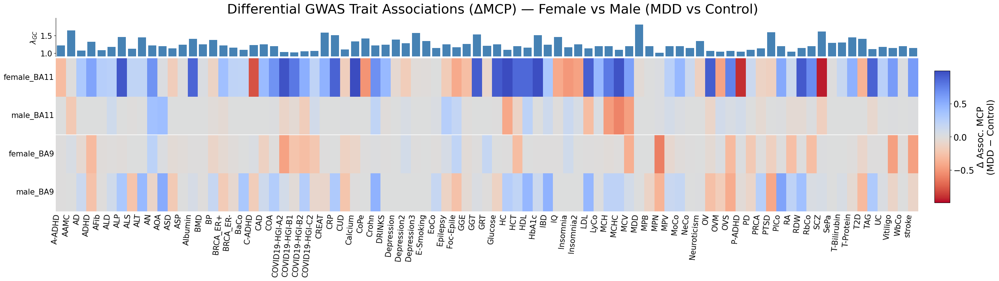

In [36]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ================================
# 1. 路径设置
# ================================
female_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
male_dir   = "/biostack/home/suchenyi/graduate/scdrs/downstream_hg38"
gc_file    = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 读取 λGC
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")
valid_traits = set(df_gc[df_gc["Lambda_GC"] <= 2].index.tolist())

# ================================
# 3. 通用 ΔMCP 读取函数
# ================================
def load_delta(data_dir, suffix, group_cols, row_key, prefix):
    traits = sorted([
        f.replace(suffix, "")
        for f in os.listdir(data_dir)
        if f.endswith(suffix)
    ])
    traits_filtered = [t for t in traits if t in valid_traits]
    print(f"[{prefix}] 原始 {len(traits)} 个，λGC<=2 后剩余 {len(traits_filtered)} 个")

    dict_delta = {}
    for trait in traits_filtered:
        fp = os.path.join(data_dir, f"{trait}{suffix}")
        if not os.path.exists(fp):
            continue
        df = pd.read_csv(fp, sep="\t")
        df[group_cols] = df["group"].str.split("&", expand=True)
        df_wide = df.pivot(index=row_key, columns="condition", values="assoc_mcp")
        if not {"C", "S"}.issubset(df_wide.columns):
            continue
        df_wide["delta"] = df_wide["S"] - df_wide["C"]
        dict_delta[trait] = df_wide["delta"]

    df_out = pd.DataFrame(dict_delta).sort_index()
    df_out.index = [f"{prefix}_{r}" for r in df_out.index]
    return df_out

# ================================
# 4. 读取 female / male
# ================================
df_female = load_delta(
    female_dir,
    suffix=".scdrs_group.region_con",
    group_cols=["REGION", "condition"],
    row_key="REGION",
    prefix="female"
)
df_male = load_delta(
    male_dir,
    suffix=".scdrs_group.con_section",
    group_cols=["condition", "section"],
    row_key="section",
    prefix="male"
)

# ================================
# 5. 合并：相同脑区交错排列
# ================================
common_traits = sorted(df_female.columns.intersection(df_male.columns))
print(f"\n共同 traits: {len(common_traits)}")

# 提取脑区名（去掉前缀）
female_regions = sorted([r.replace("female_", "") for r in df_female.index])
male_regions   = sorted([r.replace("male_",   "") for r in df_male.index])
common_regions = sorted(set(female_regions) & set(male_regions))
only_female    = sorted(set(female_regions) - set(male_regions))
only_male      = sorted(set(male_regions)   - set(female_regions))

# 交错顺序：female_BA11, male_BA11, female_BA24, male_BA24, ...
rows_ordered = []
pair_boundaries = []   # 记录每对之间的分隔线位置（在哪行之后画线）
shade_bands = []       # 记录需要背景色的行范围（每隔一对）

for i, region in enumerate(common_regions):
    start = len(rows_ordered)
    rows_ordered.append(f"female_{region}")
    rows_ordered.append(f"male_{region}")
    pair_boundaries.append(len(rows_ordered))   # 每对结束后的行号
    if i % 2 == 0:
        shade_bands.append((start, len(rows_ordered)))

# 追加只有单性别的行
for r in only_female:
    rows_ordered.append(f"female_{r}")
for r in only_male:
    rows_ordered.append(f"male_{r}")

# 合并数据框
# 合并数据框
df_all = pd.concat([df_female[common_traits], df_male[common_traits]])

# ← 新增：排除不需要的行
exclude_rows = {"male_BA12", "male_BA46"}

df_combined = df_all.loc[
    [r for r in rows_ordered if r in df_all.index and r not in exclude_rows],
    common_traits
]

n_rows, n_cols = df_combined.shape
row_is_female = [r.startswith("female_") for r in df_combined.index]

print(f"最终矩阵: {n_rows} 行 × {n_cols} 列")

# λGC barplot 数据
ordered_gc = [df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0
              for t in common_traits]

# ================================
# 6. 布局
# ================================
fig_w = max(20, n_cols * 0.35)
fig_h = max(8,  n_rows * 0.38 + 2.0)

fig = plt.figure(figsize=(fig_w, fig_h))

# GridSpec: 上=barplot, 下=heatmap
gs = gridspec.GridSpec(
    2, 1,
    height_ratios=[1, n_rows],
    hspace=0.02,
    left=0.10, right=0.89,
    top=0.88,  bottom=0.22
)

ax_bar  = fig.add_subplot(gs[0])
ax_heat = fig.add_subplot(gs[1])

# ================================
# 7. λGC Barplot
# ================================
x_pos = np.arange(n_cols) + 0.5
gc_norm   = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
bar_colors = 'steelblue'

ax_bar.bar(x_pos, ordered_gc, color=bar_colors, width=0.8, align="center")
ax_bar.set_xlim(0, n_cols)
ax_bar.set_xticks([])
ax_bar.set_ylabel("$\\lambda_{GC}$", fontsize=15)
ax_bar.set_ylim(min(ordered_gc) * 0.9, max(ordered_gc) * 1.1)
ax_bar.spines[["top", "right", "bottom"]].set_visible(False)
ax_bar.tick_params(axis="y", labelsize=15)

# ================================
# 8. Heatmap
# ================================
vmax = np.nanmax(np.abs(df_combined.values))

sns.heatmap(
    df_combined,
    ax=ax_heat,
    cmap="coolwarm_r",
    center=0,
    vmin=-vmax, vmax=vmax,
    xticklabels=common_traits,
    yticklabels=df_combined.index,
    linewidths=0,
    cbar=False
)

# 每隔一对脑区加浅灰背景（方便区分）
for start, end in shade_bands:
    ax_heat.add_patch(mpatches.Rectangle(
        (0, start), n_cols, end - start,
        color="lightgrey", alpha=0.15, zorder=0, transform=ax_heat.transData
    ))

# 每对之间画细横线（最后一对后不画）
for boundary in pair_boundaries[:-1]:
    ax_heat.axhline(y=boundary, color="white", linewidth=1.2, linestyle="-")

# ================================
# 9. 标签
# ================================
ax_heat.set_yticklabels(ax_heat.get_yticklabels(), fontsize=15,rotation=0)



# X 轴标签
ax_heat.set_xticklabels(common_traits, rotation=85, fontsize=15, ha="right")
ax_heat.set_xlabel("")
ax_heat.set_ylabel("")
ax_heat.tick_params(axis="both", which="both", length=0)

# ================================
# 10. Colorbar（手动，右侧）
# ================================
cbar_ax = fig.add_axes([0.905, 0.25, 0.014, 0.45])
sm = cm.ScalarMappable(
    cmap="coolwarm_r",
    norm=mcolors.TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)
)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Δ Assoc. MCP\n(MDD − Control)", fontsize=18)
cbar.ax.tick_params(labelsize=17)

# ================================
# 11. 标题 & 保存
# ================================
fig.suptitle(
    "Differential GWAS Trait Associations (ΔMCP) — Female vs Male (MDD vs Control)",
    fontsize=26, y=0.93
)

os.makedirs("combined_results", exist_ok=True)
out = "combined_results/scDRS_deltaMCP_female_male_heatmap"
plt.savefig(f"{out}.pdf", dpi=300, bbox_inches="tight")
plt.savefig(f"{out}.png", dpi=300, bbox_inches="tight")
print(f"已保存: {out}.pdf / .png")
plt.show()

[male] 原始 90 个，λGC<=2 后剩余 85 个
[female] 原始 90 个，λGC<=2 后剩余 85 个

共同 traits: 85,  共同 cell types: 46
已保存: combined_results/scDRS_MCP_split_triangle_heatmap.pdf / .png


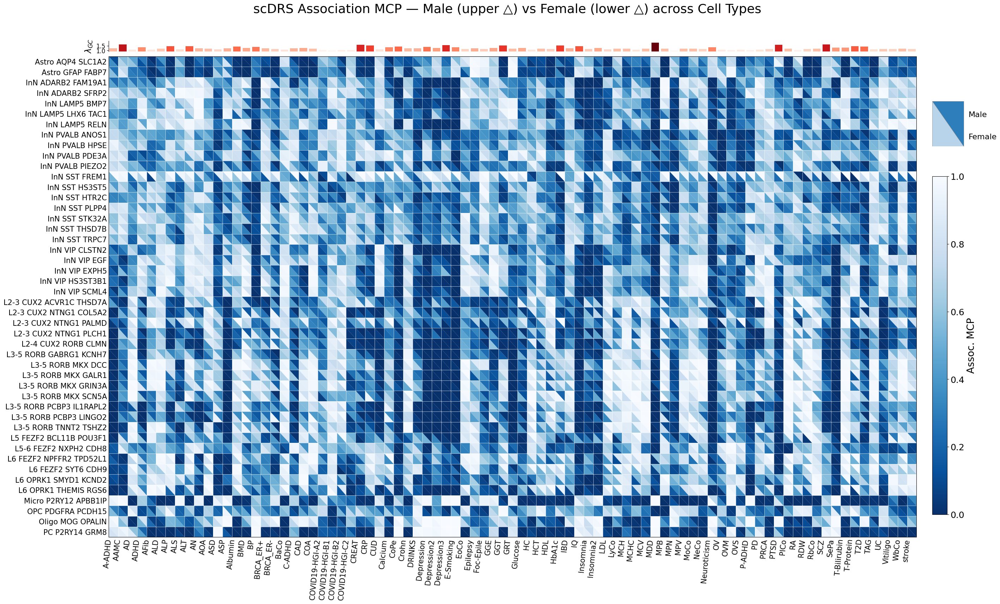

In [28]:
import os
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from matplotlib.patches import Polygon
import pandas as pd
import numpy as np

# ================================
# 1. 路径设置
# ================================
male_dir   = "/biostack/home/suchenyi/graduate/scdrs/downstream_hg38"
female_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file    = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 读取 λGC
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")
valid_traits = set(df_gc[df_gc["Lambda_GC"] <= 2].index.tolist())

# ================================
# 3. 通用读取函数
# ================================
def load_assoc(data_dir, suffix, label):
    traits = sorted([
        f.replace(suffix, "")
        for f in os.listdir(data_dir)
        if f.endswith(suffix)
    ])
    traits_f = [t for t in traits if t in valid_traits]
    print(f"[{label}] 原始 {len(traits)} 个，λGC<=2 后剩余 {len(traits_f)} 个")

    dict_df = {
        t: pd.read_csv(os.path.join(data_dir, f"{t}{suffix}"), sep="\t", index_col=0)
        for t in traits_f
    }
    samples = list(dict_df[traits_f[0]].index)
    matrix  = np.array([dict_df[t].loc[samples, "assoc_mcp"].values for t in traits_f]).T
    return pd.DataFrame(matrix, index=samples, columns=traits_f)

# ================================
# 4. 读取数据
# ================================
df_male   = load_assoc(male_dir,   ".scdrs_group.dominant_labels", "male")
df_female = load_assoc(female_dir, ".scdrs_group.cell_subtype",    "female")

# ================================
# 5. 取共同 traits 和 cell types
# ================================
common_traits = sorted(set(df_male.columns) & set(df_female.columns))
common_rows   = sorted(set(df_male.index)   & set(df_female.index))
print(f"\n共同 traits: {len(common_traits)},  共同 cell types: {len(common_rows)}")

df_m = df_male.loc[common_rows,   common_traits]
df_f = df_female.loc[common_rows, common_traits]

n_rows = len(common_rows)
n_cols = len(common_traits)

# λGC 数据
ordered_gc = [df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0
              for t in common_traits]

# ================================
# 6. 布局
# ================================
fig_w = max(20, n_cols * 0.35)
fig_h = max(8,  n_rows * 0.42 + 2.0)

fig = plt.figure(figsize=(fig_w, fig_h))
gs  = gridspec.GridSpec(
    2, 1,
    height_ratios=[1, n_rows],
    hspace=0.02,
    left=0.12, right=0.89,
    top=0.88,  bottom=0.22
)
ax_bar  = fig.add_subplot(gs[0])
ax_heat = fig.add_subplot(gs[1])

# ================================
# 7. λGC Barplot
# ================================
x_pos      = np.arange(n_cols) + 0.5
gc_norm    = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
bar_colors = [cm.Reds(gc_norm(v)) for v in ordered_gc]

ax_bar.bar(x_pos, ordered_gc, color=bar_colors, width=0.8, align="center")
ax_bar.set_xlim(0, n_cols)
ax_bar.set_xticks([])
ax_bar.set_ylabel("$\\lambda_{GC}$", fontsize=17)
ax_bar.set_ylim(min(ordered_gc) * 0.9, max(ordered_gc) * 1.1)
ax_bar.spines[["top", "right", "bottom"]].set_visible(False)
ax_bar.tick_params(axis="y", labelsize=12)

# ================================
# 8. 上下三角分割热图
# ================================
cmap = plt.cm.Blues_r
norm = mcolors.Normalize(vmin=0, vmax=1)

def safe_color(val):
    """NaN 显示为浅灰"""
    if np.isnan(val):
        return (0.85, 0.85, 0.85, 1.0)
    return cmap(norm(val))

for i, row in enumerate(common_rows):
    for j, col in enumerate(common_traits):
        m_val = df_m.loc[row, col]
        f_val = df_f.loc[row, col]

        # 单元格坐标（y 轴：i=0 在顶部）
        xl, xr = j,     j + 1
        yb, yt = n_rows - i - 1, n_rows - i

        # 上三角（右上）= 男性：顶左 → 顶右 → 底右
        upper = Polygon(
            [(xl, yt), (xr, yt), (xr, yb)],
            closed=True,
            facecolor=safe_color(m_val),
            edgecolor="none"
        )
        # 下三角（左下）= 女性：顶左 → 底左 → 底右
        lower = Polygon(
            [(xl, yt), (xl, yb), (xr, yb)],
            closed=True,
            facecolor=safe_color(f_val),
            edgecolor="none"
        )
        ax_heat.add_patch(upper)
        ax_heat.add_patch(lower)

# 单元格网格线
for i in range(n_rows + 1):
    ax_heat.axhline(i, color="white", linewidth=0.5)
for j in range(n_cols + 1):
    ax_heat.axvline(j, color="white", linewidth=0.5)

ax_heat.set_xlim(0, n_cols)
ax_heat.set_ylim(0, n_rows)

# X 轴
ax_heat.set_xticks(np.arange(n_cols) + 0.5)
ax_heat.set_xticklabels(common_traits, rotation=85, fontsize=15, ha="right")

# Y 轴（行从上到下对应 common_rows，因此 ytick labels 需反转）
ax_heat.set_yticks(np.arange(n_rows) + 0.5)
ax_heat.set_yticklabels(common_rows[::-1], fontsize=15)

ax_heat.tick_params(axis="both", which="both", length=0)
ax_heat.set_xlabel("")
ax_heat.set_ylabel("")

# ================================
# 9. Colorbar
# ================================
cbar_ax = fig.add_axes([0.905, 0.25, 0.014, 0.45])
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Assoc. MCP", fontsize=20)
cbar.ax.tick_params(labelsize=18)

# ================================
# 10. 图例（上三角/下三角说明）
# ================================
# 在热图右上角外侧用实际三角形 patch 做图例
legend_ax = fig.add_axes([0.905, 0.74, 0.06, 0.06])  # 小辅助坐标系
legend_ax.set_xlim(0, 2); legend_ax.set_ylim(0, 1)
legend_ax.axis("off")

# 男性：上三角
legend_ax.add_patch(Polygon([(0, 1), (1, 1), (1, 0)], closed=True,
                             facecolor=cmap(0.3), edgecolor="grey", lw=0.5))
legend_ax.text(1.15, 0.7, "Male",   fontsize=16, va="center")
# 女性：下三角
legend_ax.add_patch(Polygon([(0, 1), (0, 0), (1, 0)], closed=True,
                             facecolor=cmap(0.7), edgecolor="grey", lw=0.5))
legend_ax.text(1.15, 0.2, "Female", fontsize=16, va="center")

# ================================
# 11. 标题 & 保存
# ================================
fig.suptitle(
    "scDRS Association MCP — Male (upper △) vs Female (lower △) across Cell Types",
    fontsize=26, y=0.93
)

os.makedirs("combined_results", exist_ok=True)
out = "combined_results/scDRS_MCP_split_triangle_heatmap"
plt.savefig(f"{out}.pdf", dpi=300, bbox_inches="tight")
plt.savefig(f"{out}.png", dpi=300, bbox_inches="tight")
print(f"已保存: {out}.pdf / .png")
plt.show()

[male] 原始 90 个，λGC<=2 后剩余 85 个
[female] 原始 90 个，λGC<=2 后剩余 85 个

共同 traits: 85,  共同 cell types: 46
已保存: combined_results/scDRS_MCP_male_female_sidebyside.pdf / .png


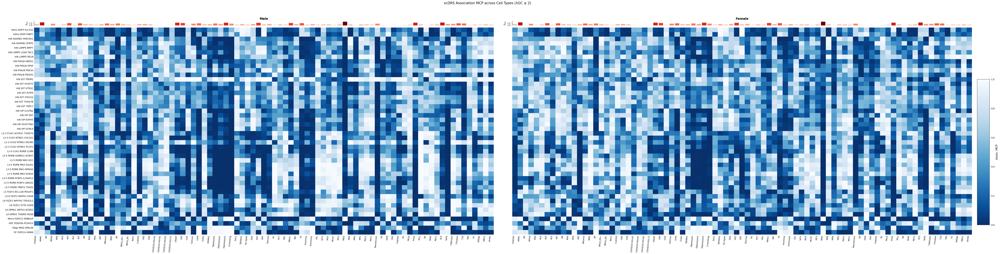

In [19]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ================================
# 1. 路径设置
# ================================
male_dir   = "/biostack/home/suchenyi/graduate/scdrs/downstream_hg38"
female_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file    = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 读取 λGC
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")
valid_traits = set(df_gc[df_gc["Lambda_GC"] <= 2].index.tolist())

# ================================
# 3. 通用读取函数
# ================================
def load_assoc(data_dir, suffix, label):
    traits = sorted([
        f.replace(suffix, "")
        for f in os.listdir(data_dir)
        if f.endswith(suffix)
    ])
    traits_f = [t for t in traits if t in valid_traits]
    print(f"[{label}] 原始 {len(traits)} 个，λGC<=2 后剩余 {len(traits_f)} 个")
    dict_df = {
        t: pd.read_csv(os.path.join(data_dir, f"{t}{suffix}"), sep="\t", index_col=0)
        for t in traits_f
    }
    samples = list(dict_df[traits_f[0]].index)
    matrix  = np.array([dict_df[t].loc[samples, "assoc_mcp"].values for t in traits_f]).T
    return pd.DataFrame(matrix, index=samples, columns=traits_f)

# ================================
# 4. 读取数据
# ================================
df_male   = load_assoc(male_dir,   ".scdrs_group.dominant_labels", "male")
df_female = load_assoc(female_dir, ".scdrs_group.cell_subtype",    "female")

# ================================
# 5. 统一行列顺序（共同 traits & cell types）
# ================================
common_traits = sorted(set(df_male.columns) & set(df_female.columns))
common_rows   = sorted(set(df_male.index)   & set(df_female.index))
print(f"\n共同 traits: {len(common_traits)},  共同 cell types: {len(common_rows)}")

# 两张图使用完全相同的行列顺序
df_m = df_male.loc[common_rows,   common_traits]
df_f = df_female.loc[common_rows, common_traits]

n_rows = len(common_rows)
n_cols = len(common_traits)

# λGC（列顺序与 common_traits 一致）
ordered_gc = [df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0
              for t in common_traits]

# ================================
# 6. 布局：两列并排
#    每列结构（从上到下）：barplot → heatmap
# ================================
fig_w  = max(28, n_cols * 0.35 * 2 + 4)
fig_h  = max(8,  n_rows * 0.38 + 2.5)

# 外层 GridSpec：左图 | 间距 | 右图
outer = gridspec.GridSpec(
    1, 3,
    width_ratios=[1, 0.04, 1],   # 左图 | 窄间隔 | 右图
    left=0.06, right=0.97,
    top=0.88,  bottom=0.22,
    wspace=0.0
)

def make_panel(fig, outer_cell, title):
    """在 outer_cell 内创建 barplot + heatmap 的子布局，返回 (ax_bar, ax_heat)"""
    inner = gridspec.GridSpecFromSubplotSpec(
        2, 1,
        subplot_spec=outer_cell,
        height_ratios=[1, n_rows],
        hspace=0.02
    )
    ax_bar  = fig.add_subplot(inner[0])
    ax_heat = fig.add_subplot(inner[1])
    ax_bar.set_title(title, fontsize=14, fontweight="bold", pad=6)
    return ax_bar, ax_heat

fig = plt.figure(figsize=(fig_w, fig_h))

ax_bar_m, ax_heat_m = make_panel(fig, outer[0], "Male")
ax_bar_f, ax_heat_f = make_panel(fig, outer[2], "Female")

# ================================
# 7. λGC Barplot（两图共用同一数据，x 轴对齐）
# ================================
gc_norm    = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
bar_colors = [cm.Reds(gc_norm(v)) for v in ordered_gc]
x_pos      = np.arange(n_cols) + 0.5

for ax_bar in [ax_bar_m, ax_bar_f]:
    ax_bar.bar(x_pos, ordered_gc, color=bar_colors, width=0.8, align="center")
    ax_bar.set_xlim(0, n_cols)
    ax_bar.set_xticks([])
    ax_bar.set_ylabel("$\\lambda_{GC}$", fontsize=11)
    ax_bar.set_ylim(min(ordered_gc) * 0.9, max(ordered_gc) * 1.1)
    ax_bar.spines[["top", "right", "bottom"]].set_visible(False)
    ax_bar.tick_params(axis="y", labelsize=9)

# ================================
# 8. Heatmap（共用色阶 vmin/vmax）
# ================================
vmin, vmax = 0, 1

def draw_heatmap(ax, df, show_ylabel):
    sns.heatmap(
        df,
        ax=ax,
        cmap="Blues_r",
        vmin=vmin, vmax=vmax,
        xticklabels=common_traits,
        yticklabels=common_rows if show_ylabel else False,
        linewidths=0,
        cbar=False
    )
    ax.set_xticklabels(common_traits, rotation=85, fontsize=9, ha="right")
    if show_ylabel:
        ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
    ax.tick_params(axis="both", which="both", length=0)
    ax.set_xlabel("")
    ax.set_ylabel("")

draw_heatmap(ax_heat_m, df_m, show_ylabel=True)   # 左图显示行标签
draw_heatmap(ax_heat_f, df_f, show_ylabel=False)  # 右图省略（顺序相同，无需重复）

# ================================
# 9. 共用 Colorbar（最右侧）
# ================================
cbar_ax = fig.add_axes([0.975, 0.25, 0.012, 0.45])
sm = cm.ScalarMappable(cmap="Blues_r", norm=mcolors.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Assoc. MCP", fontsize=12)
cbar.ax.tick_params(labelsize=10)

# ================================
# 10. 总标题 & 保存
# ================================
fig.suptitle(
    "scDRS Association MCP across Cell Types (λGC ≤ 2)",
    fontsize=15, y=0.94
)

os.makedirs("combined_results", exist_ok=True)
out = "combined_results/scDRS_MCP_male_female_sidebyside"
plt.savefig(f"{out}.pdf", dpi=300, bbox_inches="tight")
plt.savefig(f"{out}.png", dpi=300, bbox_inches="tight")
print(f"已保存: {out}.pdf / .png")
plt.show()

[male] 原始 90 个，λGC<=2 后剩余 85 个
[female] 原始 90 个，λGC<=2 后剩余 85 个

共同 traits: 85,  共同 cell types: 46
已保存: combined_results/scDRS_deltaMCP_sex_diff_heatmap.pdf / .png


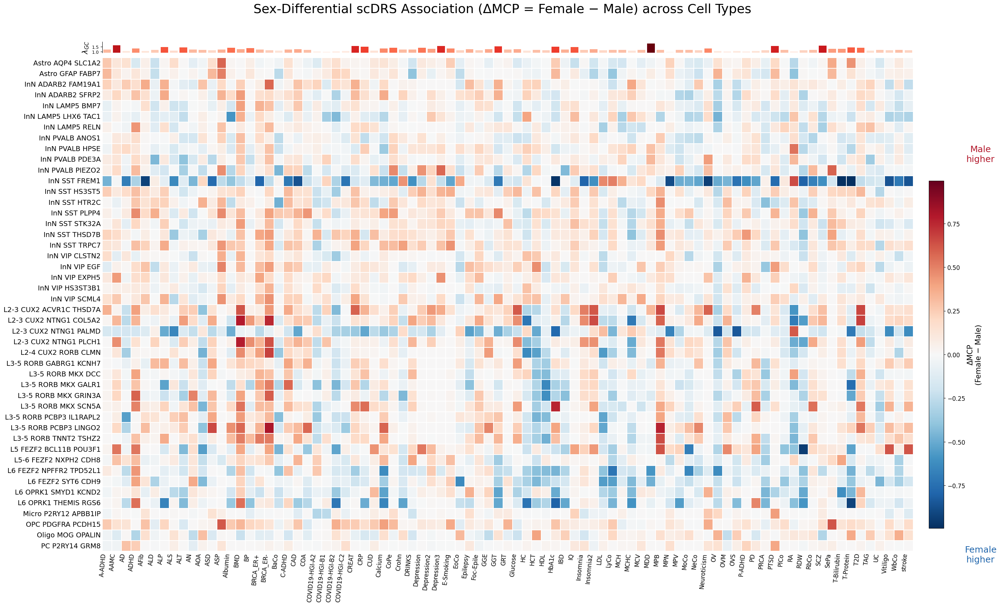

In [23]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ================================
# 1. 路径设置
# ================================
male_dir   = "/biostack/home/suchenyi/graduate/scdrs/downstream_hg38"
female_dir = "/biostack/home/suchenyi/graduate/scdrs/female_downstream1"
gc_file    = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ================================
# 2. 读取 λGC
# ================================
df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")
valid_traits = set(df_gc[df_gc["Lambda_GC"] <= 2].index.tolist())

# ================================
# 3. 通用读取函数
# ================================
def load_assoc(data_dir, suffix, label):
    traits = sorted([
        f.replace(suffix, "")
        for f in os.listdir(data_dir)
        if f.endswith(suffix)
    ])
    traits_f = [t for t in traits if t in valid_traits]
    print(f"[{label}] 原始 {len(traits)} 个，λGC<=2 后剩余 {len(traits_f)} 个")
    dict_df = {
        t: pd.read_csv(os.path.join(data_dir, f"{t}{suffix}"), sep="\t", index_col=0)
        for t in traits_f
    }
    samples = list(dict_df[traits_f[0]].index)
    matrix  = np.array([dict_df[t].loc[samples, "assoc_mcp"].values for t in traits_f]).T
    return pd.DataFrame(matrix, index=samples, columns=traits_f)

# ================================
# 4. 读取数据
# ================================
df_male   = load_assoc(male_dir,   ".scdrs_group.dominant_labels", "male")
df_female = load_assoc(female_dir, ".scdrs_group.cell_subtype",    "female")

# ================================
# 5. 共同 traits & cell types，计算 ΔMCP = Female - Male
# ================================
common_traits = sorted(set(df_male.columns) & set(df_female.columns))
common_rows   = sorted(set(df_male.index)   & set(df_female.index))
print(f"\n共同 traits: {len(common_traits)},  共同 cell types: {len(common_rows)}")

df_m = df_male.loc[common_rows,   common_traits]
df_f = df_female.loc[common_rows, common_traits]

df_delta = df_f - df_m   # 正值 = 女性更高，负值 = 男性更高

n_rows = len(common_rows)
n_cols = len(common_traits)

# λGC
ordered_gc = [df_gc.loc[t, "Lambda_GC"] if t in df_gc.index else 1.0
              for t in common_traits]

# ================================
# 6. 布局：barplot（上）+ heatmap（下）
# ================================
fig_w = max(20, n_cols * 0.35)
fig_h = max(8,  n_rows * 0.42 + 2.5)

fig = plt.figure(figsize=(fig_w, fig_h))
gs  = gridspec.GridSpec(
    2, 1,
    height_ratios=[1, n_rows],
    hspace=0.02,
    left=0.12, right=0.89,
    top=0.88,  bottom=0.22
)
ax_bar  = fig.add_subplot(gs[0])
ax_heat = fig.add_subplot(gs[1])

# ================================
# 7. λGC Barplot
# ================================
x_pos      = np.arange(n_cols) + 0.5
gc_norm    = mcolors.Normalize(vmin=min(ordered_gc), vmax=max(ordered_gc))
bar_colors = [cm.Reds(gc_norm(v)) for v in ordered_gc]

ax_bar.bar(x_pos, ordered_gc, color=bar_colors, width=0.8, align="center")
ax_bar.set_xlim(0, n_cols)
ax_bar.set_xticks([])
ax_bar.set_ylabel("$\\lambda_{GC}$", fontsize=15)
ax_bar.set_ylim(min(ordered_gc) * 0.9, max(ordered_gc) * 1.1)
ax_bar.spines[["top", "right", "bottom"]].set_visible(False)
ax_bar.tick_params(axis="y", labelsize=9)

# ================================
# 8. Delta Heatmap
# ================================
# 对称色阶，0 居中
vmax = np.nanmax(np.abs(df_delta.values))
vmin = -vmax

sns.heatmap(
    df_delta,
    ax=ax_heat,
    cmap="RdBu_r",          # 暖色=Female高，冷色=Male高
    center=0,
    vmin=vmin, vmax=vmax,
    xticklabels=common_traits,
    yticklabels=common_rows,
    linewidths=0.3,
    linecolor="white",
    cbar=False
)

ax_heat.set_xticklabels(common_traits, rotation=85, fontsize=12, ha="right")
ax_heat.set_yticklabels(ax_heat.get_yticklabels(), fontsize=14)
ax_heat.tick_params(axis="both", which="both", length=0)
ax_heat.set_xlabel("")
ax_heat.set_ylabel("")

# ================================
# 9. Colorbar
# ================================
cbar_ax = fig.add_axes([0.905, 0.25, 0.014, 0.45])
sm = cm.ScalarMappable(
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("ΔMCP\n(Female − Male)", fontsize=15)
cbar.ax.tick_params(labelsize=12)

# 在 colorbar 上下加注释
cbar_ax.text(3.5, 1.05, "Male\nhigher", ha="center", va="bottom",
             fontsize=18, color="#b2182b", transform=cbar_ax.transAxes)
cbar_ax.text(3.5, -0.05, "Female\nhigher", ha="center", va="top",
             fontsize=18, color="#2166ac", transform=cbar_ax.transAxes)

# ================================
# 10. 标题 & 保存
# ================================
fig.suptitle(
    "Sex-Differential scDRS Association (ΔMCP = Female − Male) across Cell Types",
    fontsize=26, y=0.93
)

os.makedirs("combined_results", exist_ok=True)
out = "combined_results/scDRS_deltaMCP_sex_diff_heatmap"
plt.savefig(f"{out}.pdf", dpi=300, bbox_inches="tight")
plt.savefig(f"{out}.png", dpi=300, bbox_inches="tight")
print(f"已保存: {out}.pdf / .png")
plt.show()